In [ ]:
!pip install -q yellowbrick

In [ ]:
!pip install -q gspread

In [ ]:
import gspread
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as mp
import seaborn as sns
import scipy
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

pd.set_option('display.max_rows', 500)

In [ ]:
# Load the dataset
df = pd.read_csv('https://docs.google.com/spreadsheets/d/e/2PACX-1vTxI2iPyht8YqYn9Lq4sXSL3cFB5cPCPChDOwqMsGYpBIt6_KWUpnk4c3XoJ3UMBThlTOL0dPE7qPaT/pub?gid=2083245515&single=true&output=csv')

df.head()

,City,Year,Crime type,Number of Crime,Latitude,Longitude,Population of the city,Race,Ethnicity,Race/ethnicity population,Occupation,Workforce by Occupation and Gender,Median Earnings
0,"Wichita, KS",2013,Murders,15.0,37.6872,97.3301,606150,White Alone,Not Hispanic or Latino,246185,Management Occupations,15502,109122
1,"Wichita, KS",2013,Murders,15.0,37.6872,97.3301,606150,White Alone,Hispanic or Latino,40522,Management Occupations,15502,109122
2,"Wichita, KS",2013,Murders,15.0,37.6872,97.3301,606150,Black or African American Alone,Not Hispanic or Latino,42332,Management Occupations,15502,109122
3,"Wichita, KS",2013,Murders,15.0,37.6872,97.3301,606150,Black or African American Alone,Hispanic or Latino,670,Management Occupations,15502,109122
4,"Wichita, KS",2013,Murders,15.0,37.6872,97.3301,606150,American Indian & Alaska Native Alone,Not Hispanic or Latino,2614,Management Occupations,15502,109122


In [ ]:
df.tail()

,City,Year,Crime type,Number of Crime,Latitude,Longitude,Population of the city,Race,Ethnicity,Race/ethnicity population,Occupation,Workforce by Occupation and Gender,Median Earnings
168205,"Hutchinson, KS",2020,Crime Index,117.2,38.060844,-97.929771,61423,Native Hawaiian & Other Pacific Islander Alone,Hispanic or Latino,0,Transportation Occupations,610,86465
168206,"Hutchinson, KS",2020,Crime Index,117.2,38.060844,-97.929771,61423,Some Other Race Alone,Not Hispanic or Latino,19,Transportation Occupations,610,86465
168207,"Hutchinson, KS",2020,Crime Index,117.2,38.060844,-97.929771,61423,Some Other Race Alone,Hispanic or Latino,421,Transportation Occupations,610,86465
168208,"Hutchinson, KS",2020,Crime Index,117.2,38.060844,-97.929771,61423,Two or More Races,Not Hispanic or Latino,1379,Transportation Occupations,610,86465
168209,"Hutchinson, KS",2020,Crime Index,117.2,38.060844,-97.929771,61423,Two or More Races,Hispanic or Latino,853,Transportation Occupations,610,86465


In [ ]:
df.shape

(168210, 13)

## EDA

In [ ]:
df.isna().sum()

City                                  0
Year                                  0
Crime type                            0
Number of Crime                       0
Latitude                              0
Longitude                             0
Population of the city                0
Race                                  0
Ethnicity                             0
Race/ethnicity population             0
Occupation                            0
Workforce by Occupation and Gender    0
Median Earnings                       0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168210 entries, 0 to 168209
Data columns (total 13 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   City                                168210 non-null  object 
 1   Year                                168210 non-null  int64  
 2   Crime type                          168210 non-null  object 
 3   Number of Crime                     168210 non-null  float64
 4   Latitude                            168210 non-null  float64
 5   Longitude                           168210 non-null  float64
 6   Population of the city              168210 non-null  int64  
 7   Race                                168210 non-null  object 
 8   Ethnicity                           168210 non-null  object 
 9   Race/ethnicity population           168210 non-null  int64  
 10  Occupation                          168210 non-null  object 
 11  Workforce by Occupation an

In [ ]:
df.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
168205    False
168206    False
168207    False
168208    False
168209    False
Length: 168210, dtype: bool

In [ ]:
cormat = df.corr()
round(cormat,2)

<ipython-input-7-c450962e4570>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cormat = df.corr()


,Year,Number of Crime,Latitude,Longitude,Population of the city,Race/ethnicity population,Workforce by Occupation and Gender,Median Earnings
Year,1.00,-0.02,-0.00,-0.00,0.01,0.00,0.02,0.09
Number of Crime,-0.02,1.00,-0.32,0.16,0.44,0.11,0.24,-0.01
Latitude,-0.00,-0.32,1.00,0.19,-0.65,-0.15,-0.31,0.08
Longitude,-0.00,0.16,0.19,1.00,0.35,0.10,0.24,0.17
Population of the city,0.01,0.44,-0.65,0.35,1.00,0.25,0.55,-0.03
Race/ethnicity population,0.00,0.11,-0.15,0.10,0.25,1.00,0.15,0.00
Workforce by Occupation and Gender,0.02,0.24,-0.31,0.24,0.55,0.15,1.00,0.05
Median Earnings,0.09,-0.01,0.08,0.17,-0.03,0.00,0.05,1.00


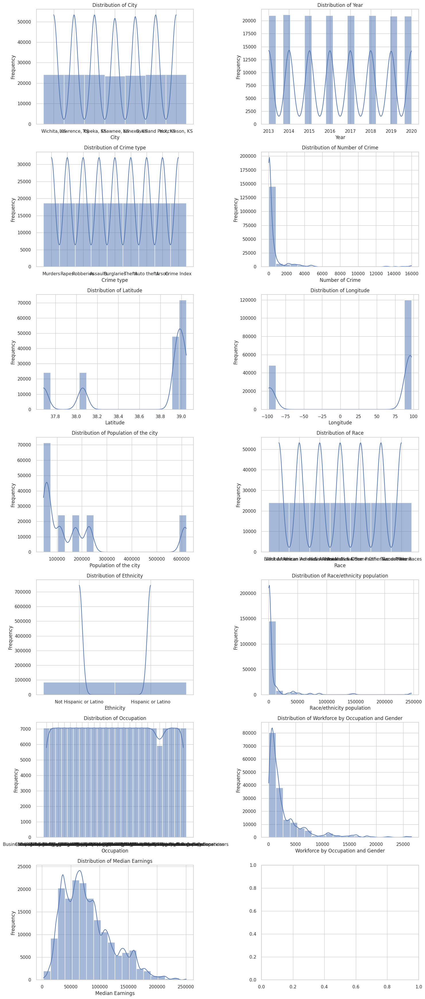

In [ ]:
columns_to_plot = df.columns

# Set the style
sns.set(style="whitegrid")

# Create subplots based on the number of columns you want to visualize
num_plots = len(columns_to_plot)
num_cols = 2  # Number of columns in each row of subplots
num_rows = (num_plots + 1) // num_cols

# Create a figure and axes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

# Flatten the axes array if there's only one row
axes = axes.flatten()

# Plot histograms for each column
for i, column in enumerate(columns_to_plot):
    sns.histplot(df[column], bins=20, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
df.describe(include='all')

,City,Year,Crime type,Number of Crime,Latitude,Longitude,Population of the city,Race,Ethnicity,Race/ethnicity population,Occupation,Workforce by Occupation and Gender,Median Earnings
count,168210,168210.000000,168210,168210.000000,168210.000000,168210.000000,168210.000000,168210,168210,168210.000000,168210,168210.000000,168210.000000
unique,7,NaN,9,NaN,NaN,NaN,NaN,7,2,NaN,24,NaN,NaN
top,"Wichita, KS",NaN,Murders,NaN,NaN,NaN,NaN,White Alone,Not Hispanic or Latino,NaN,Management Occupations,NaN,NaN
freq,24192,NaN,18690,NaN,NaN,NaN,NaN,24030,84105,NaN,7056,NaN,NaN
mean,NaN,2016.493633,NaN,656.527549,38.671251,40.194542,186754.856180,NaN,NaN,9740.366453,NaN,2795.556554,79691.846442
std,NaN,2.290141,NaN,2016.630039,0.517316,86.934646,185074.387455,NaN,NaN,31370.759897,NaN,3727.211065,42552.766633
min,NaN,2013.000000,NaN,0.000000,37.687200,-97.929771,45851.000000,NaN,NaN,0.000000,NaN,25.000000,2499.000000
25%,NaN,2014.000000,NaN,9.000000,38.060844,-95.277390,62498.000000,NaN,NaN,64.000000,NaN,671.000000,46441.000000
50%,NaN,2016.000000,NaN,99.000000,38.960213,94.715200,112721.000000,NaN,NaN,624.000000,NaN,1460.000000,70617.000000
75%,NaN,2018.000000,NaN,402.200000,39.022800,95.675200,228420.000000,NaN,NaN,3648.000000,NaN,3408.000000,104749.000000


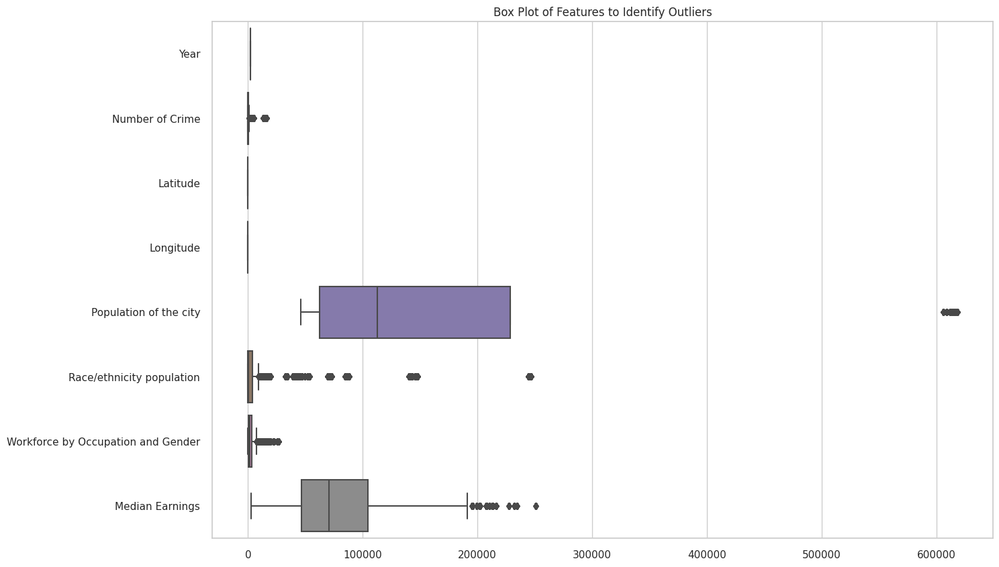

In [ ]:
plt.figure(figsize=(15, 10))
sns.boxplot(data=df, orient='h')
plt.title('Box Plot of Features to Identify Outliers')
plt.show()

In [ ]:
# Define the columns
numeric_columns = ['Year', 'Number of Crime', 'Latitude', 'Longitude',
                   'Population of the city', 'Race/ethnicity population',
                   'Workforce by Occupation and Gender', 'Median Earnings']
categorical_columns = ['City', 'Crime type', 'Race', 'Ethnicity', 'Occupation']

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline  # Import the Pipeline class

In [ ]:
# Create a preprocessor for scaling and encoding
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_columns),
        ('cat', OneHotEncoder(), categorical_columns)
    ])

# Apply the transformations and clustering
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('cluster', KMeans(n_clusters=5, random_state=42))
])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


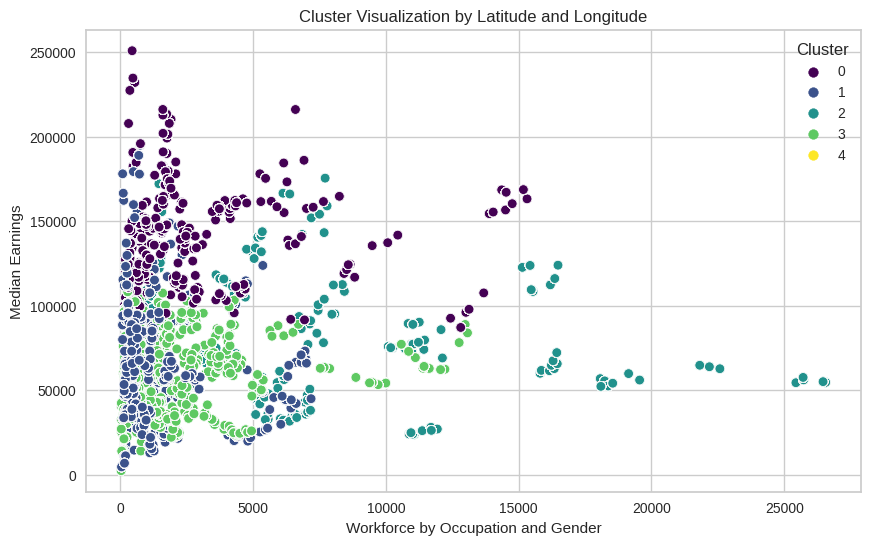

In [ ]:
# Fit the model
pipeline.fit(df)

# Predict clusters
df['Cluster'] = pipeline.predict(df)

# Visualization
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Workforce by Occupation and Gender', y='Median Earnings', hue='Cluster', data=df, palette='viridis')
plt.title('Cluster Visualization by Latitude and Longitude')
plt.show()

In [ ]:
df.head()

,City,Year,Crime type,Number of Crime,Latitude,Longitude,Population of the city,Race,Ethnicity,Race/ethnicity population,Occupation,Workforce by Occupation and Gender,Median Earnings,Cluster
0,"Wichita, KS",2013,Murders,15.0,37.6872,97.3301,606150,White Alone,Not Hispanic or Latino,246185,Management Occupations,15502,109122,4
1,"Wichita, KS",2013,Murders,15.0,37.6872,97.3301,606150,White Alone,Hispanic or Latino,40522,Management Occupations,15502,109122,2
2,"Wichita, KS",2013,Murders,15.0,37.6872,97.3301,606150,Black or African American Alone,Not Hispanic or Latino,42332,Management Occupations,15502,109122,2
3,"Wichita, KS",2013,Murders,15.0,37.6872,97.3301,606150,Black or African American Alone,Hispanic or Latino,670,Management Occupations,15502,109122,2
4,"Wichita, KS",2013,Murders,15.0,37.6872,97.3301,606150,American Indian & Alaska Native Alone,Not Hispanic or Latino,2614,Management Occupations,15502,109122,2


In [ ]:
g = df.groupby(['Cluster']).mean()

<ipython-input-15-9fdbd49f2c42>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  g = df.groupby(['Cluster']).mean()


In [ ]:
g

,Year,Number of Crime,Latitude,Longitude,Population of the city,Race/ethnicity population,Workforce by Occupation and Gender,Median Earnings
Cluster,,,,,,,,
0,2016.997902,288.920577,38.986920,89.058889,115799.640157,4539.303808,3009.054659,143090.552785
1,2016.498674,169.583142,38.506950,-96.614134,86815.312997,4795.621448,1435.236074,66161.352785
2,2016.500000,2778.677778,37.687200,97.330100,612873.000000,10951.721154,7470.354167,78002.536458
3,2016.264406,395.864889,39.004448,95.002155,133855.957347,5439.039670,1928.235875,61762.912504
4,2016.500000,1604.305556,38.334700,96.000450,393382.812500,195372.250000,5803.195312,84276.953125


In [ ]:
from sklearn.decomposition import PCA

In [ ]:
!pip install plotly

In [ ]:
import plotly.express as px

In [ ]:
# Use the preprocessor part of the pipeline to transform the data
preprocessor = pipeline.named_steps['preprocessor']
transformed_features = preprocessor.transform(df)

# Convert sparse matrix to dense array if necessary
if hasattr(transformed_features, "toarray"):
    transformed_features = transformed_features.toarray()

# Perform PCA for dimensionality reduction to 3 components
pca = PCA(n_components=3)
pca_result = pca.fit_transform(transformed_features)

# Create a new DataFrame for the PCA results
df_pca = pd.DataFrame(pca_result, columns=['PCA1', 'PCA2', 'PCA3'])
df_pca['Cluster'] = df['Cluster']  # Add the cluster column

# 3D Visualization using Plotly
fig = px.scatter_3d(df_pca, x='PCA1', y='PCA2', z='PCA3', color='Cluster',
                    title='3D Visualization of Clusters')
fig.show()

Scratch work

## Feature analysis

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1879: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "


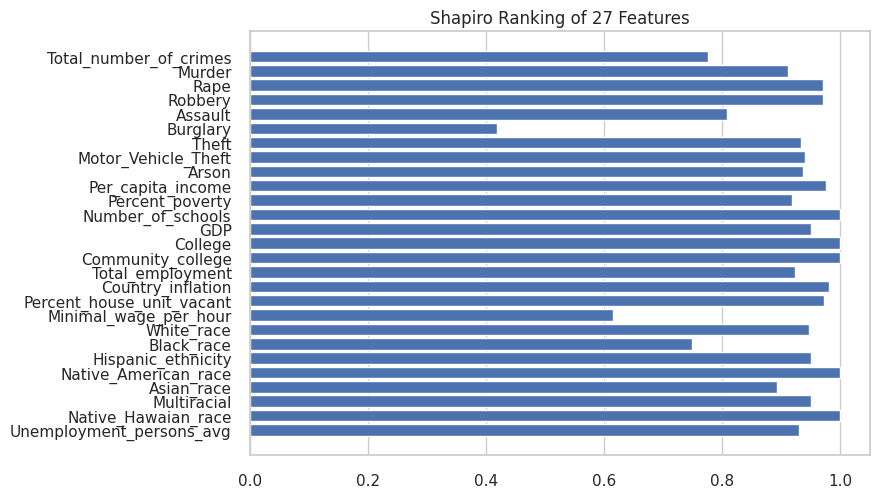

<Axes: title={'center': 'Shapiro Ranking of 27 Features'}>

In [ ]:
from yellowbrick.features import Rank1D, Rank2D

visualizer = Rank1D(algorithm='shapiro')

visualizer.fit(df)           # Fit the data to the visualizer
visualizer.transform(df)        # Transform the data
visualizer.show()              # Finalize and render the figure

/usr/local/lib/python3.10/dist-packages/yellowbrick/features/pca.py:458: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self.fig.tight_layout()


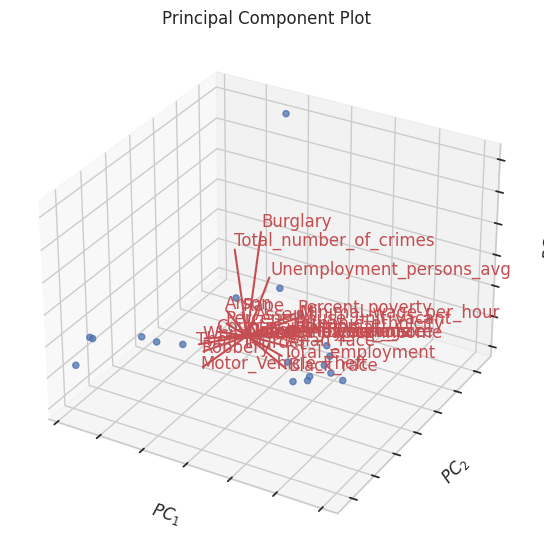

<Axes3D: title={'center': 'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$', zlabel='$PC_3$'>

In [ ]:
from yellowbrick.features import PCA

visualizer = PCA(scale=True, proj_features=True, projection=3, colorbar= True)
visualizer.fit_transform(clustering_df_no_outliers)
plt.tight_layout()  # Try applying tight_layout here
visualizer.show()

## Scaling data

In [ ]:
scaler = StandardScaler()
df3 =scaler.fit_transform(clustering_df_no_outliers)

In [ ]:
norm = MinMaxScaler()
df_3_normed = norm.fit_transform(clustering_df_no_outliers)

## Elbow Method

In [ ]:
from yellowbrick.cluster import KElbowVisualizer

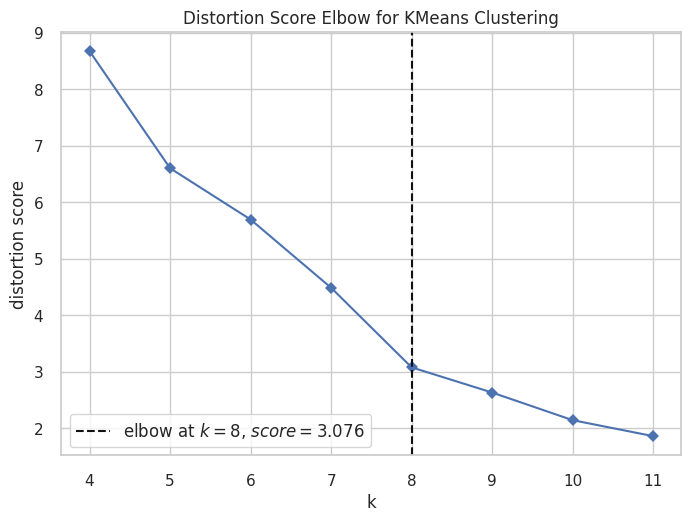

The best value of k based on the elbow method is: 8


In [ ]:
def perform_kmeans_hyperparameter_tuning(data, k_range=(4, 12), metric='distortion', timings=False, random_state=None):
    """
    Perform hyperparameter tuning for k-means clustering using the KElbowVisualizer.

    Parameters:
    - data: The input data for clustering.
    - k_range: Tuple representing the range of k values to explore (default is (4, 12)).
    - metric: The metric to use for evaluation (default is 'distortion').
    - timings: Whether to display the fit times for each k (default is False).
    - random_state: Seed for reproducibility (default is None).

    Returns:
    - The best value of k based on the elbow method.
    """

    # Instantiate the clustering model and visualizer
    model = KMeans(random_state=random_state, n_init='auto')
    visualizer = KElbowVisualizer(model, k=k_range, metric=metric, timings=timings)

    # Fit the data to the visualizer
    visualizer.fit(data)

    # Display the visualizer
    visualizer.show()

    # Return the best value of k
    return visualizer.elbow_value_

# Example usage:
best_k = perform_kmeans_hyperparameter_tuning(df_3_normed)
print(f"The best value of k based on the elbow method is: {best_k}")


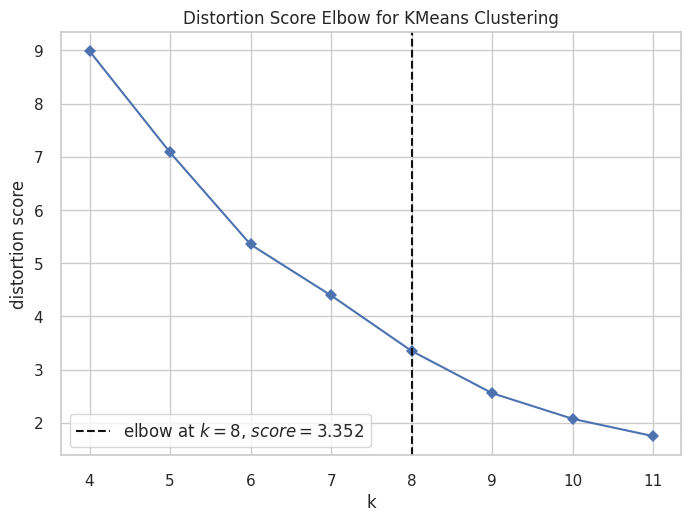

The best value of k based on the elbow method is: 8


In [ ]:
best_k = perform_kmeans_hyperparameter_tuning(df_3_normed)
print(f"The best value of k based on the elbow method is: {best_k}")

## Silhouette Score

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


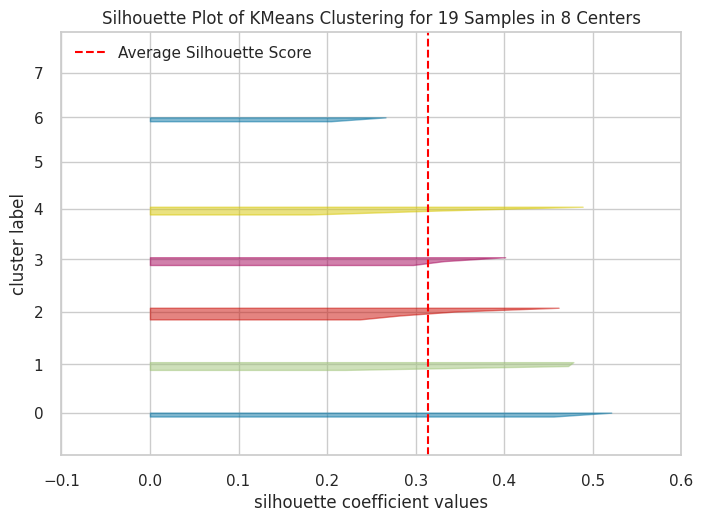

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 19 Samples in 8 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer

# Instantiate the clustering model and visualizer
model = KMeans(random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

visualizer.fit(df_3_normed)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

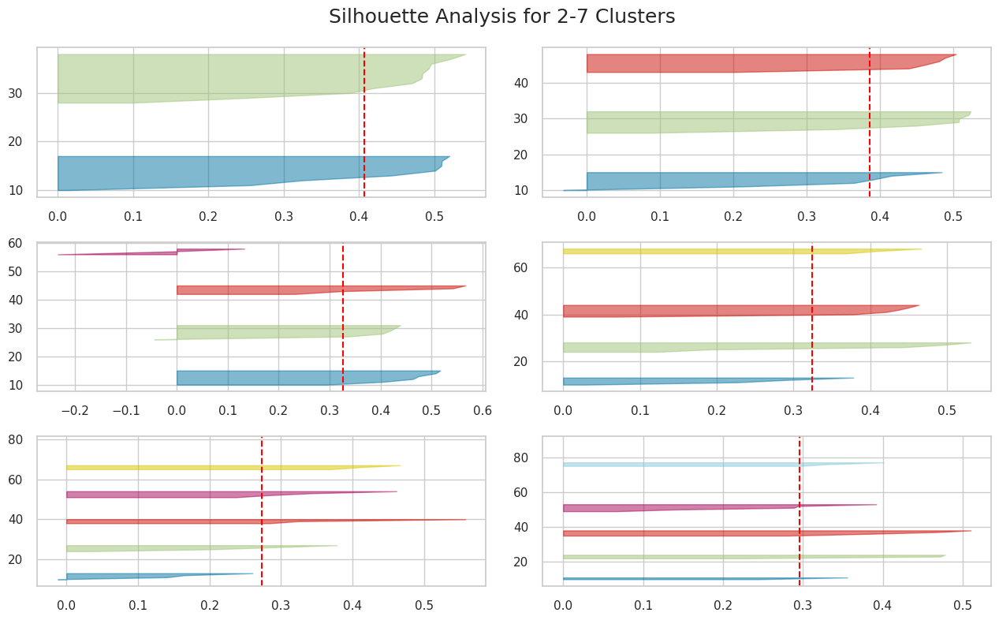

In [ ]:
fig, ax = plt.subplots(3, 2, figsize=(13,8))
fig.suptitle('Silhouette Analysis for 2-7 Clusters', size = 18)
plt.tight_layout()

for i in [2, 3, 4, 5, 6, 7]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(df_3_normed)

## Modeling

In [ ]:
kmeans_model_crime = KMeans(n_clusters=8, init = 'k-means++', n_init='auto')
kmeans_model_crime.fit(df_3_normed)

KMeans(n_init='auto')

In [ ]:
clus_lbls = kmeans_model_crime.labels_
clus_centers = kmeans_model_crime.cluster_centers_

the closer to centers are in the visualization, the closer they are in the original feature space. The clusters are sized according to a scoring metric. By default, they are sized by membership, e.g. the number of instances that belong to each center. This gives a sense of the relative importance of clusters. Note however, that because two clusters overlap in the 2D space, it does not imply that they overlap in the original feature space.

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


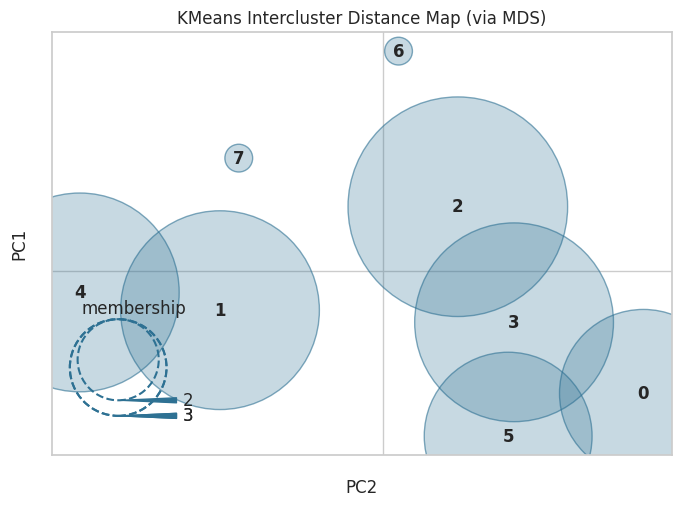

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [ ]:
from yellowbrick.cluster import InterclusterDistance

visualizer = InterclusterDistance(kmeans_model_crime)

visualizer.fit(df_3_normed)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

In [ ]:
clust_df_cp = clustering_df_no_outliers.copy()
clust_df_cp['Cluster_Labels'] = clus_lbls

clust_df_cp.head()

,Total_number_of_crimes,Murder,Rape,Robbery,Assault,Burglary,Theft,Motor_Vehicle_Theft,Arson,Per_capita_income,...,Minimal_wage_per_hour,White_race,Black_race,Hispanic_ethnicity,Native_American_race,Asian_race,Multiracial,Native_Hawaian_race,Unemployment_persons_avg,Cluster_Labels
1,81862,173,1187,1077,10985,9751,49663,8514,512,58857,...,7.25,74.7,5.8,12.7,0.8,3.1,2.8,0.1,64600,0
2,87920,193,1190,1312,11201,11267,53381,8802,574,55935,...,7.25,75.0,5.8,12.5,0.8,3.1,2.7,0.1,69975,0
3,87471,130,1297,1422,9845,11277,54990,8047,463,52876,...,7.25,75.4,5.7,12.3,0.8,3.1,2.7,0.1,47825,5
4,92686,146,1346,1599,9276,12459,58885,8351,624,50663,...,7.25,75.6,5.7,12.1,0.8,3.1,2.6,0.1,51275,5
5,93690,176,1214,1747,8605,13392,59725,8232,599,48651,...,7.25,75.9,5.8,11.9,0.8,3.0,2.6,0.1,57750,3


In [ ]:
clust_df_cp.isna().sum()

Total_number_of_crimes       0
Murder                       0
Rape                         0
Robbery                      0
Assault                      0
Burglary                     0
Theft                        0
Motor_Vehicle_Theft          0
Arson                        0
Per_capita_income            0
Percent_poverty              0
Number_of_schools            0
GDP                          0
College                      0
Community_college            0
Total_employment             0
Country_inflation            0
Percent_house_unit_vacant    0
Minimal_wage_per_hour        0
White_race                   0
Black_race                   0
Hispanic_ethnicity           0
Native_American_race         0
Asian_race                   0
Multiracial                  0
Native_Hawaian_race          0
Unemployment_persons_avg     0
Cluster_Labels               0
dtype: int64

In [ ]:
grouped_clusters = clust_df_cp.groupby('Cluster_Labels')

cluster_means = grouped_clusters.mean()

In [ ]:
cluster_means

,Total_number_of_crimes,Murder,Rape,Robbery,Assault,Burglary,Theft,Motor_Vehicle_Theft,Arson,Per_capita_income,...,Percent_house_unit_vacant,Minimal_wage_per_hour,White_race,Black_race,Hispanic_ethnicity,Native_American_race,Asian_race,Multiracial,Native_Hawaian_race,Unemployment_persons_avg
Cluster_Labels,,,,,,,,,,,,,,,,,,,,,
0,84891.000000,183.000000,1188.500000,1194.500000,11093.000000,10509.000000,51522.000000,8658.000000,543.000000,57396.000000,...,1.050000,7.25,74.850000,5.800000,12.600000,0.8,3.100000,2.750000,0.1,67287.500000
1,108405.000000,121.666667,1155.000000,1839.000000,7902.666667,18718.000000,70327.333333,7460.000000,881.333333,38334.666667,...,2.000000,2.65,79.766667,5.700000,9.500000,0.8,2.233333,1.933333,0.1,64441.666667
2,94104.250000,107.000000,1031.000000,1418.750000,7275.750000,17156.500000,59743.250000,6653.750000,718.250000,45374.000000,...,1.975000,7.25,77.350000,5.775000,11.000000,0.8,2.650000,2.350000,0.1,88262.500000
3,91372.333333,152.000000,1161.666667,1733.333333,8078.333333,14054.333333,58067.333333,7509.000000,616.333333,47769.666667,...,1.633333,7.25,76.133333,5.800000,11.700000,0.8,2.966667,2.533333,0.1,61583.333333
4,116336.666667,116.666667,1052.666667,2110.666667,7077.000000,19005.333333,76901.666667,9251.333333,821.333333,31154.000000,...,2.566667,2.65,81.233333,5.666667,8.433333,0.8,2.066667,1.700000,0.1,73817.666667
5,90078.500000,138.000000,1321.500000,1510.500000,9560.500000,11868.000000,56937.500000,8199.000000,543.500000,51769.500000,...,1.450000,7.25,75.500000,5.700000,12.200000,0.8,3.100000,2.650000,0.1,49550.000000
6,167522.000000,105.000000,1109.000000,1622.000000,7593.000000,87926.000000,62370.000000,5951.000000,846.000000,39960.000000,...,2.400000,7.25,78.200000,5.700000,10.600000,0.8,2.400000,2.200000,0.1,109325.000000
7,99801.000000,130.000000,1125.000000,1765.000000,8080.000000,19362.000000,62514.000000,5782.000000,1043.000000,39431.000000,...,2.900000,2.65,78.700000,5.700000,10.200000,0.8,2.300000,2.100000,0.1,89850.000000


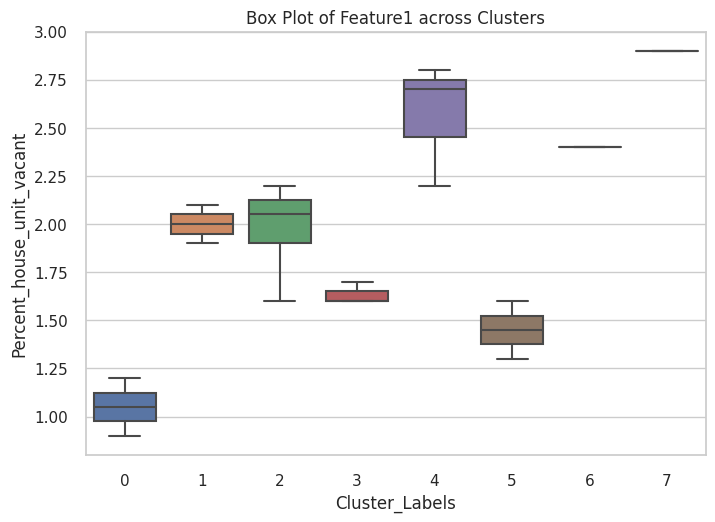

In [ ]:
# Example for Feature1
sns.boxplot(x='Cluster_Labels', y='Percent_house_unit_vacant', data=clust_df_cp)
plt.title('Box Plot of Feature1 across Clusters')
plt.show()

In [ ]:
!pip install -q umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 1.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 4.7 MB/s eta 0:00:00


In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

In [ ]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_3_normed)

# t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=5)
tsne_result = tsne.fit_transform(df_3_normed)

# UMAP
umap = UMAP(n_components=2, random_state=42)
umap_result = umap.fit_transform(df_3_normed)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [ ]:
# Combine results into a DataFrame
visualization_df = pd.DataFrame({
    'PCA1': pca_result[:, 0],
    'PCA2': pca_result[:, 1],
    # 'PCA3': pca_result[:, 2],
    't-SNE1': tsne_result[:, 0],
    't-SNE2': tsne_result[:, 1],
    # 't-SNE3': tsne_result[:, 2],
    'UMAP1': umap_result[:, 0],
    'UMAP2': umap_result[:, 1],
    # 'UMAP3': umap_result[:, 2],
    'Cluster_Labels': clus_lbls
})

In [ ]:
# Plotly 3D Scatter Plot
fig = px.scatter(
    visualization_df,
    x='PCA1', y='PCA2',
    color='Cluster_Labels',
    title='PCA 3D Visualization'
)
fig.show()

fig = px.scatter(
    visualization_df,
    x='t-SNE1', y='t-SNE2',
    color='Cluster_Labels',
    title='t-SNE 3D Visualization'
)
fig.show()

fig = px.scatter(
    visualization_df,
    x='UMAP1', y='UMAP2',
    color='Cluster_Labels',
    title='UMAP 3D Visualization'
)
fig.show()

### DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn import metrics

db = DBSCAN(eps=0.3, min_samples=10).fit(df_3_normed)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

['y', 'b', 'g', 'r']


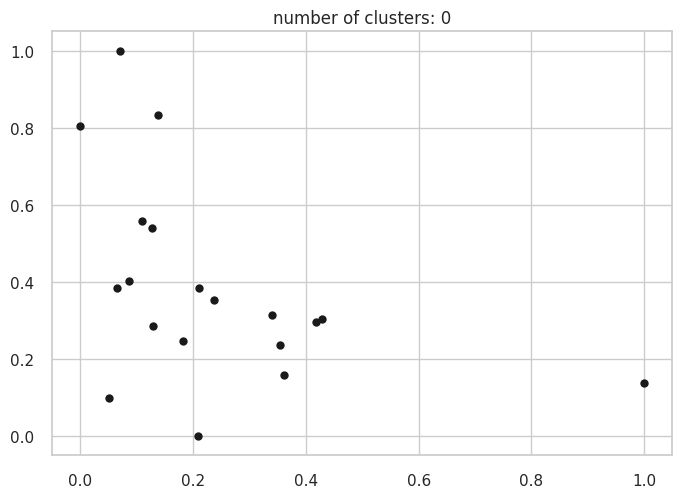

In [ ]:
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = ['y', 'b', 'g', 'r']
print(colors)
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = 'k'

    class_member_mask = (labels == k)

    xy = df_3_normed[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
             markeredgecolor='k',
             markersize=6)

    xy = df_3_normed[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
             markeredgecolor='k',
             markersize=6)

plt.title('number of clusters: %d' % n_clusters_)
plt.show()